In [1]:
import requests
from PIL import Image
import numpy as np
import torch
from transformers import AutoProcessor, Owlv2ForObjectDetection, DetrImageProcessor, DetrForObjectDetection
from transformers.utils.constants import OPENAI_CLIP_MEAN, OPENAI_CLIP_STD
import jsonlines
import torchaudio
from datasets import Dataset, load_metric
from pathlib import Path
import random
import librosa
import os
import IPython.display as ipd
from dotenv import load_dotenv
import evaluate
from spellchecker import SpellChecker
from dataclasses import dataclass, field
from typing import Any, Dict, List, Optional, Union
import pandas as pd
from sklearn.model_selection import train_test_split
import cv2
import matplotlib.pyplot as plt

ImportError: cannot import name 'Owlv2ForObjectDetection' from 'transformers' (/opt/conda/lib/python3.10/site-packages/transformers/__init__.py)

In [2]:
load_dotenv()

TEAM_NAME = os.getenv("TEAM_NAME", "7up")
TEAM_TRACK = os.getenv("TEAM_TRACK", "advanced")


input_dir = Path(f"/home/jupyter/{TEAM_TRACK}")
# input_dir = Path(f"../../data/{TEAM_TRACK}/train")
results_dir = Path(f"/home/jupyter/{TEAM_NAME}")
# results_dir = Path("results")
results_dir.mkdir(parents=True, exist_ok=True)
data = {'image': [], 'annotations': []}
count = 0

with jsonlines.open(input_dir / "vlm.jsonl") as reader:
    for obj in reader:
        if count < 1:  # Check if we have processed less than 10 entries
            data['image'].append(obj['image'])
            data['annotations'].append(obj['annotations'])
            count += 1
        else:
            break

In [4]:
import transformers
print("Transformers version:", transformers.__version__)

Transformers version: 4.40.2


In [3]:
data

{'image': ['image_0.jpg'],
 'annotations': [[{'caption': 'grey missile', 'bbox': [912, 164, 48, 152]},
   {'caption': 'red, white, and blue light aircraft',
    'bbox': [1032, 80, 24, 28]},
   {'caption': 'green and black missile', 'bbox': [704, 508, 76, 64]},
   {'caption': 'white and red helicopter', 'bbox': [524, 116, 112, 48]}]]}

In [4]:
for image_path in data['image']:
    # Load an image
    image_path = input_dir / "images" / image_path  # Change this to your image path
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

    # Convert to PIL image
    image_pil = Image.fromarray(image)

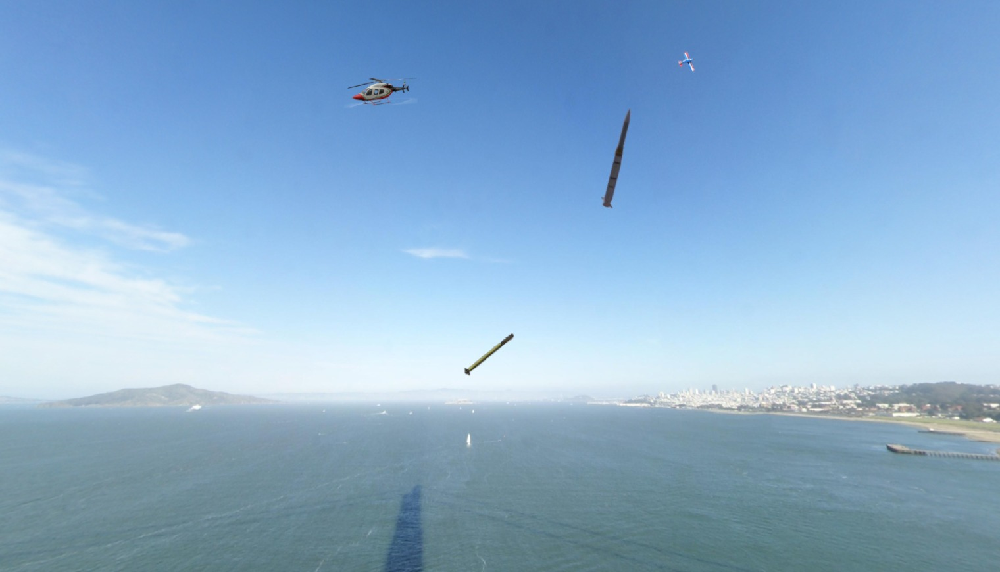

In [5]:
image_pil

In [16]:
import requests

import torch
from PIL import Image
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection 

model_id = "IDEA-Research/grounding-dino-base"
device = "cuda" if torch.cuda.is_available() else "cpu"

processor = AutoProcessor.from_pretrained(model_id)
model = AutoModelForZeroShotObjectDetection.from_pretrained(model_id).to(device)

image = image_pil
# VERY important: text queries need to be lowercased + end with a dot
text = "a helicopter. a plane. a missile."

inputs = processor(images=image, text=text, return_tensors="pt").to(device)
with torch.no_grad():
    outputs = model(**inputs)

results = processor.post_process_grounded_object_detection(
    outputs,
    inputs.input_ids,
    box_threshold=0.4,
    text_threshold=0.3,
    target_sizes=[image.size[::-1]]
)

/opt/conda/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [17]:
print(results[0]['boxes'].cpu().numpy()[0])
print(results[0]['boxes'].cpu().numpy()[1])
print(results[0]['boxes'].cpu().numpy())
print(results)

[[912.00183 161.76396 962.13794 319.02182]
 [701.71576 503.14288 783.4896  573.5611 ]]

[525.67346 111.48863 633.12274 163.60689]
[911.9236  162.16014 962.6645  319.36475]
[[525.67346 111.48863 633.12274 163.60689]
 [911.9236  162.16014 962.6645  319.36475]]
[{'scores': tensor([0.6602, 0.4355], device='cuda:0'), 'labels': ['a helicopter', 'a missile'], 'boxes': tensor([[525.6735, 111.4886, 633.1227, 163.6069],
        [911.9236, 162.1601, 962.6645, 319.3647]], device='cuda:0')}]


/opt/conda/lib/python3.10/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


[911.27099609375, 161.3092803955078, 962.6026000976562, 319.6658020019531] [912, 164, 48, 152]


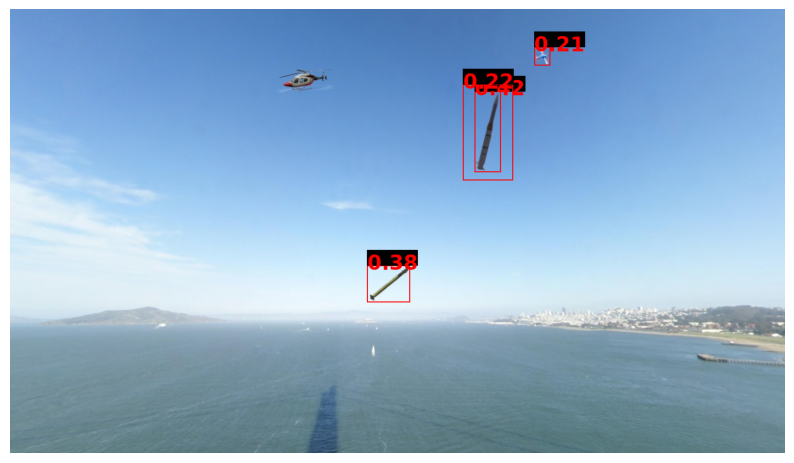

[523.6437377929688, 110.9434814453125, 630.6232299804688, 164.26844787597656] [1032, 80, 24, 28]


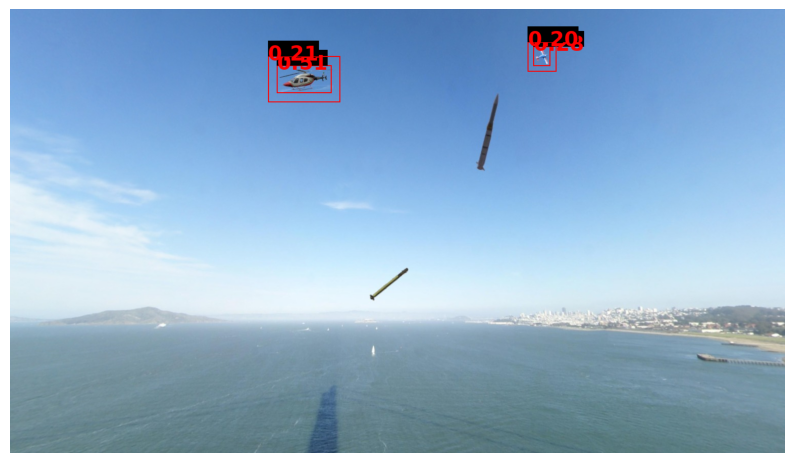

[699.5531005859375, 502.1986999511719, 784.730712890625, 574.78759765625] [704, 508, 76, 64]


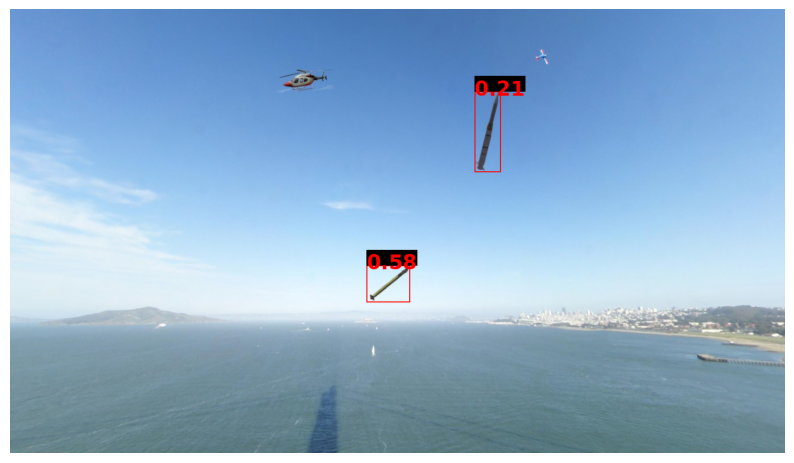

[524.894287109375, 112.24595642089844, 631.5888671875, 163.48306274414062] [524, 116, 112, 48]


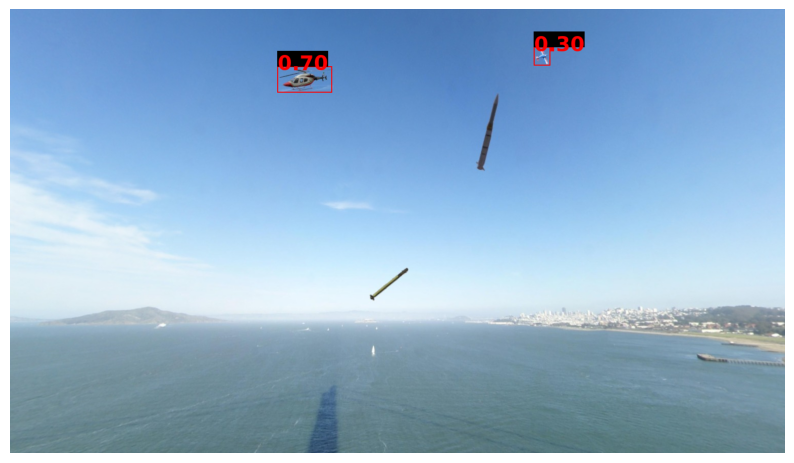

[1106.3060302734375, 503.7392272949219, 1253.617431640625, 566.1727294921875] [1112, 172, 64, 36]


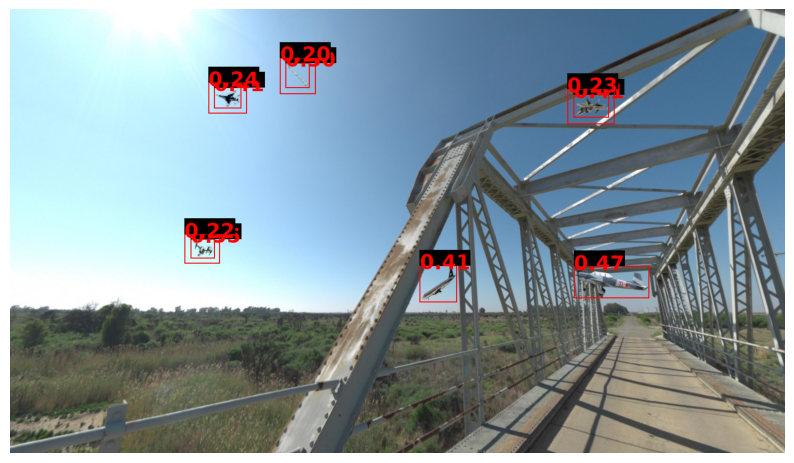

[1105.7630615234375, 501.5787353515625, 1253.8046875, 566.9454956054688] [1108, 512, 144, 48]


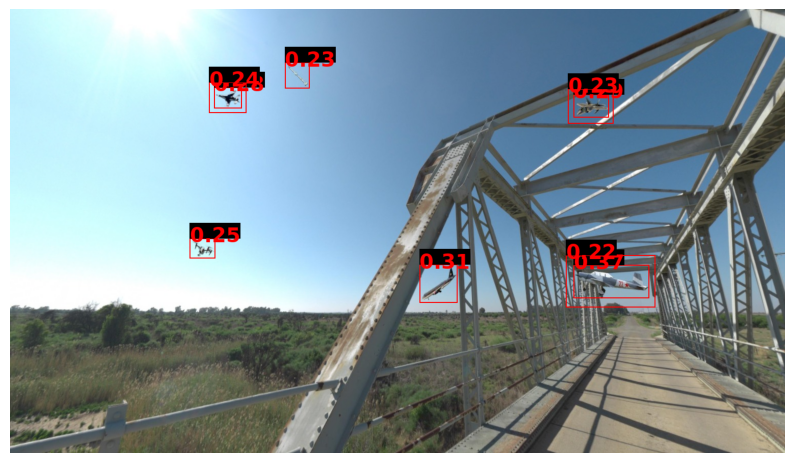

[1106.7008056640625, 168.03823852539062, 1174.4232177734375, 212.0123748779297] [356, 452, 48, 32]


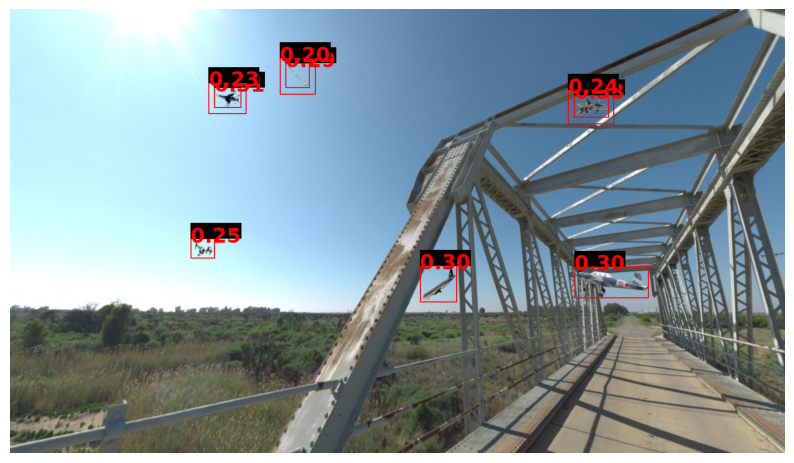

[1105.8026123046875, 502.30194091796875, 1253.39013671875, 566.8075561523438] [404, 156, 48, 36]


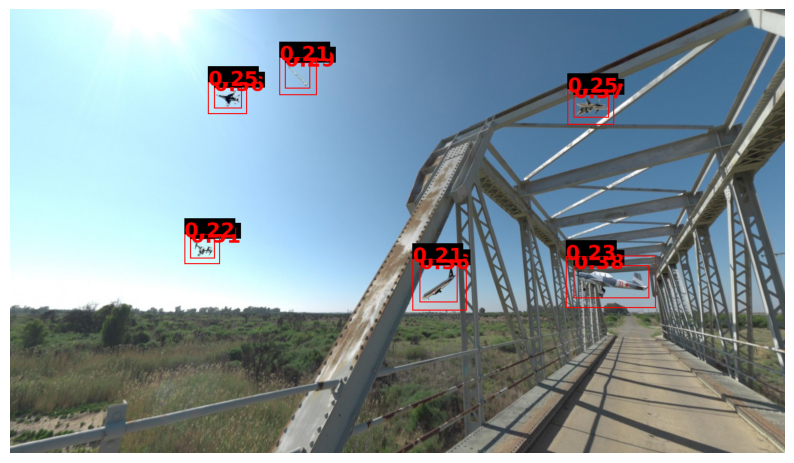

[1109.379638671875, 505.91375732421875, 1252.5897216796875, 562.3644409179688] [544, 112, 40, 40]


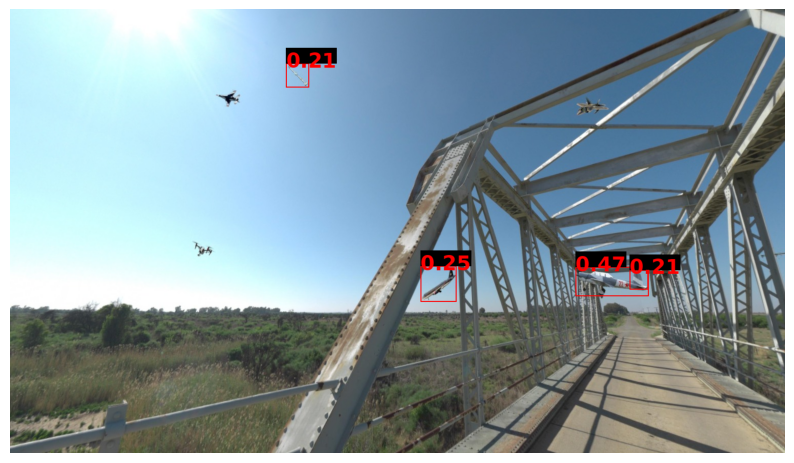

[400.5908508300781, 153.60855102539062, 453.89434814453125, 193.9373321533203] [808, 504, 68, 68]


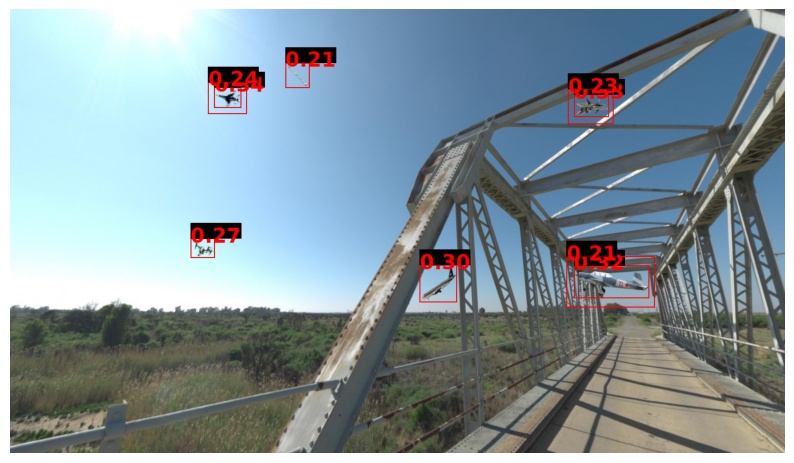

In [31]:
import requests
import torch
from PIL import Image, ImageDraw, ImageFont
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection
import matplotlib.pyplot as plt

# Load model and processor
model_id = "IDEA-Research/grounding-dino-base"
device = "cuda" if torch.cuda.is_available() else "cpu"
processor = AutoProcessor.from_pretrained(model_id)
model = AutoModelForZeroShotObjectDetection.from_pretrained(model_id).to(device)

for image_path, annotations in zip(data['image'], data['annotations']):
    for annotation in annotations:
        # print(image_path, annotation['caption'], annotation['bbox'])
        
        # Load an image
        image_path = input_dir / "images" / image_path  # Change this to your image path
        image = cv2.imread(str(image_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

        image = Image.fromarray(image)


        # Lowercased text queries ending with a dot
        text = "small " + annotation['caption'] + "."

        # Process the inputs
        inputs = processor(images=image, text=text, return_tensors="pt").to(device)

        # Model inference
        with torch.no_grad():
            outputs = model(**inputs)

        # Post-process the results
        results = processor.post_process_grounded_object_detection(
            outputs,
            inputs.input_ids,
            box_threshold=0.2,
            text_threshold=0.9,
            target_sizes=[image.size[::-1]]
        )
        def convert_bbox_format(bbox: List[float]) -> List[int]:
                xmin, ymin, xmax, ymax = bbox
                width = xmax - xmin
                height = ymax - ymin
                return [int(xmin), int(ymin), int(width), int(height)]
        scores_list = results[0]['scores'].tolist()

        # Get the index of the maximum score
        max_score_index = scores_list.index(max(scores_list))

        # Retrieve the box with the highest score
        box_with_highest_score = results[0]['boxes'][max_score_index].tolist()
        print(box_with_highest_score, annotation['bbox'])

        def plot_bounding_boxes(image, results):
            draw = ImageDraw.Draw(image)
            font_size = 40  # Specify the font size
            font = ImageFont.truetype("/usr/share/fonts/truetype/dejavu/DejaVuSans-Bold.ttf", font_size)

            boxes = results[0]['boxes'].cpu().numpy()
            scores = results[0]['scores'].cpu().numpy()

            for box, score in zip(boxes, scores):
                draw.rectangle(((box[0], box[1]), (box[2], box[3])), outline="red", width=2)
                text = f"{score:.2f}"

                # Get text size (manually calculate it if necessary)
                text_size = draw.textbbox((0, 0), text, font=font)
                text_width = text_size[2] - text_size[0]
                text_height = text_size[3] - text_size[1]

                # Adjust text position
                text_location = (box[0], box[1] - text_height) if box[1] - text_height > 0 else (box[0], box[1])

                # Draw text background for better visibility
                draw.rectangle([text_location, (text_location[0] + text_width, text_location[1] + text_height)], fill="black")
                draw.text(text_location, text, fill="red", font=font)

            return image

        # Example usage
        # Assuming 'image' is your input image and 'results' is the detection results
        image_with_boxes = plot_bounding_boxes(image.copy(), results)

        # Display the image with bounding boxes
        plt.figure(figsize=(10, 10))
        plt.imshow(image_with_boxes)
        plt.axis("off")
        plt.show()


WARNING ⚠️ NMS time limit 0.550s exceeded
0: 384x640 3 planess, 92.2ms
Speed: 49.0ms preprocess, 92.2ms inference, 1107.4ms postprocess per image at shape (1, 3, 384, 640)
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0., 0., 0.], device='cuda:0')
conf: tensor([0.7185, 0.6622, 0.6486], device='cuda:0')
data: tensor([[400.4339, 153.7022, 452.6379, 193.2224,   0.7185,   0.0000],
        [545.2546, 112.0514, 587.3468, 154.0507,   0.6622,   0.0000],
        [356.5022, 447.5941, 402.3082, 490.8438,   0.6486,   0.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (870, 1520)
shape: torch.Size([3, 6])
xywh: tensor([[426.5359, 173.4623,  52.2040,  39.5202],
        [566.3007, 133.0510,  42.0922,  41.9993],
        [379.4052, 469.2189,  45.8060,  43.2497]], device='cuda:0')
xywhn: tensor([[0.2806, 0.1994, 0.0343, 0.0454],
        [0.3726, 0.1529, 0.0277, 0.0483],
        [0.2496, 0.5393, 0.0301, 0.0497]], device='cuda:0')
xyxy: tensor([[400.4339, 153.7022, 4

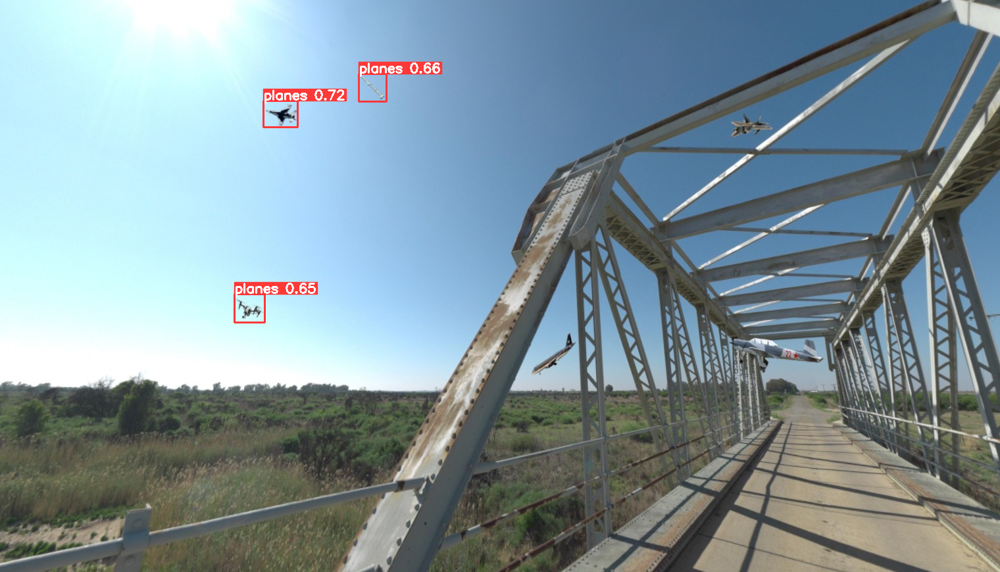

In [7]:
from ultralyticsplus import YOLO, render_result

# load model
model = YOLO('keremberke/yolov8m-plane-detection')

# set model parameters
model.overrides['conf'] = 0.1 # 0.25  # NMS confidence threshold
model.overrides['iou'] = 0.45  # NMS IoU threshold
model.overrides['agnostic_nms'] = False  # NMS class-agnostic
model.overrides['max_det'] = 1000  # maximum number of detections per image

# set image
image = image_pil #'https://github.com/ultralytics/yolov5/raw/master/data/images/zidane.jpg'

# perform inference
results = model.predict(image)

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([0., 0., 0.], device='cuda:0')
conf: tensor([0.7185, 0.6622, 0.6486], device='cuda:0')
data: tensor([[400.4339, 153.7022, 452.6379, 193.2224,   0.7185,   0.0000],
        [545.2546, 112.0514, 587.3468, 154.0507,   0.6622,   0.0000],
        [356.5022, 447.5941, 402.3082, 490.8438,   0.6486,   0.0000]], device='cuda:0')
id: None
is_track: False
orig_shape: (870, 1520)
shape: torch.Size([3, 6])
xywh: tensor([[426.5359, 173.4623,  52.2040,  39.5202],
        [566.3007, 133.0510,  42.0922,  41.9993],
        [379.4052, 469.2189,  45.8060,  43.2497]], device='cuda:0')
xywhn: tensor([[0.2806, 0.1994, 0.0343, 0.0454],
        [0.3726, 0.1529, 0.0277, 0.0483],
        [0.2496, 0.5393, 0.0301, 0.0497]], device='cuda:0')
xyxy: tensor([[400.4339, 153.7022, 452.6379, 193.2224],
        [545.2546, 112.0514, 587.3468, 154.0507],
        [356.5022, 447.5941, 402.3082, 490.8438]], device='cuda:0')
xyxyn: tensor([[0.2634, 0.1767, 0.2

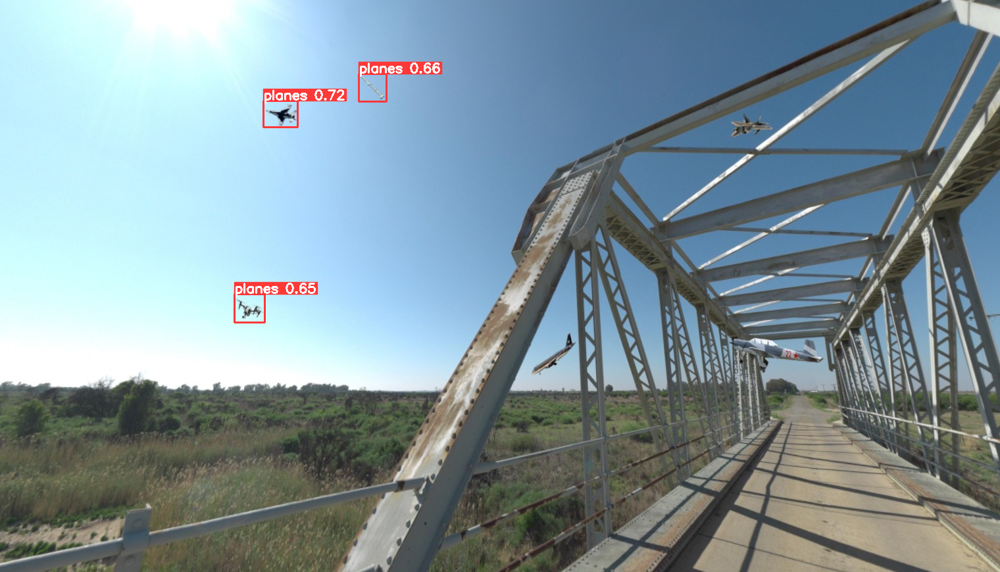

In [10]:
# observe results
print(results[0].boxes)
render = render_result(model=model, image=image, result=results[0])

# Save the rendered image to a file
render.save('output.png')

# Open the saved image (this will use the default image viewer on your system)
img = Image.open('output.png')
display(img)

In [13]:
results[0].boxes.xyxy.cpu().numpy().tolist()

[[400.43389892578125,
  153.70217895507812,
  452.637939453125,
  193.22235107421875],
 [545.254638671875, 112.05136108398438, 587.3468017578125, 154.0506591796875],
 [356.5022277832031, 447.5940856933594, 402.3082275390625, 490.84375]]

In [17]:
from llava.model.builder import load_pretrained_model
from llava.mm_utils import get_model_name_from_path
from llava.eval.run_llava import eval_model

model_path = "liuhaotian/llava-v1.5-7b"

tokenizer, model, image_processor, context_len = load_pretrained_model(
    model_path=model_path,
    model_base=None,
    model_name=get_model_name_from_path(model_path))


ModuleNotFoundError: No module named 'llava'

In [16]:
model_path = "liuhaotian/llava-v1.5-7b"
prompt = "What are the things I should be cautious about when I visit here?"
image_file = "https://llava-vl.github.io/static/images/view.jpg"

args = type('Args', (), {
    "model_path": model_path,
    "model_base": None,
    "model_name": get_model_name_from_path(model_path),
    "query": prompt,
    "conv_mode": None,
    "image_file": image_file,
    "sep": ",",
    "temperature": 0,
    "top_p": None,
    "num_beams": 1,
    "max_new_tokens": 512
})()

eval_model(args)

NameError: name 'get_model_name_from_path' is not defined

In [14]:
import requests
from PIL import Image
import numpy as np
import torch
from transformers import AutoProcessor, Owlv2ForObjectDetection
from transformers.utils.constants import OPENAI_CLIP_MEAN, OPENAI_CLIP_STD

processor = AutoProcessor.from_pretrained("google/owlv2-base-patch16")
model = Owlv2ForObjectDetection.from_pretrained("google/owlv2-base-patch16")

image = image_pil
texts = [["a photo of a plane"]]
inputs = processor(text=texts, images=image, return_tensors="pt")

# forward pass
with torch.no_grad():
    outputs = model(**inputs)

# Note: boxes need to be visualized on the padded, unnormalized image
# hence we'll set the target image sizes (height, width) based on that

def get_preprocessed_image(pixel_values):
    pixel_values = pixel_values.squeeze().numpy()
    unnormalized_image = (pixel_values * np.array(OPENAI_CLIP_STD)[:, None, None]) + np.array(OPENAI_CLIP_MEAN)[:, None, None]
    unnormalized_image = (unnormalized_image * 255).astype(np.uint8)
    unnormalized_image = np.moveaxis(unnormalized_image, 0, -1)
    unnormalized_image = Image.fromarray(unnormalized_image)
    return unnormalized_image

unnormalized_image = get_preprocessed_image(inputs.pixel_values)

target_sizes = torch.Tensor([unnormalized_image.size[::-1]])
# Convert outputs (bounding boxes and class logits) to final bounding boxes and scores
results = processor.post_process_object_detection(
    outputs=outputs, threshold=0.2, target_sizes=target_sizes
)

i = 0  # Retrieve predictions for the first image for the corresponding text queries
text = texts[i]
boxes, scores, labels = results[i]["boxes"], results[i]["scores"], results[i]["labels"]

for box, score, label in zip(boxes, scores, labels):
    box = [round(i, 2) for i in box.tolist()]
    print(box)
    print(f"Detected {text[label]} with confidence {round(score.item(), 3)} at location {box}")


[651.24, 48.73, 668.15, 69.43]
Detected a photo of a plane with confidence 0.308 at location [651.24, 48.73, 668.15, 69.43]
[578.78, 103.38, 605.29, 202.69]
Detected a photo of a plane with confidence 0.212 at location [578.78, 103.38, 605.29, 202.69]
